# 🧠 WiDS Datathon 2025 Challenge: Predicting ADHD and Sex from Brain Imaging Data

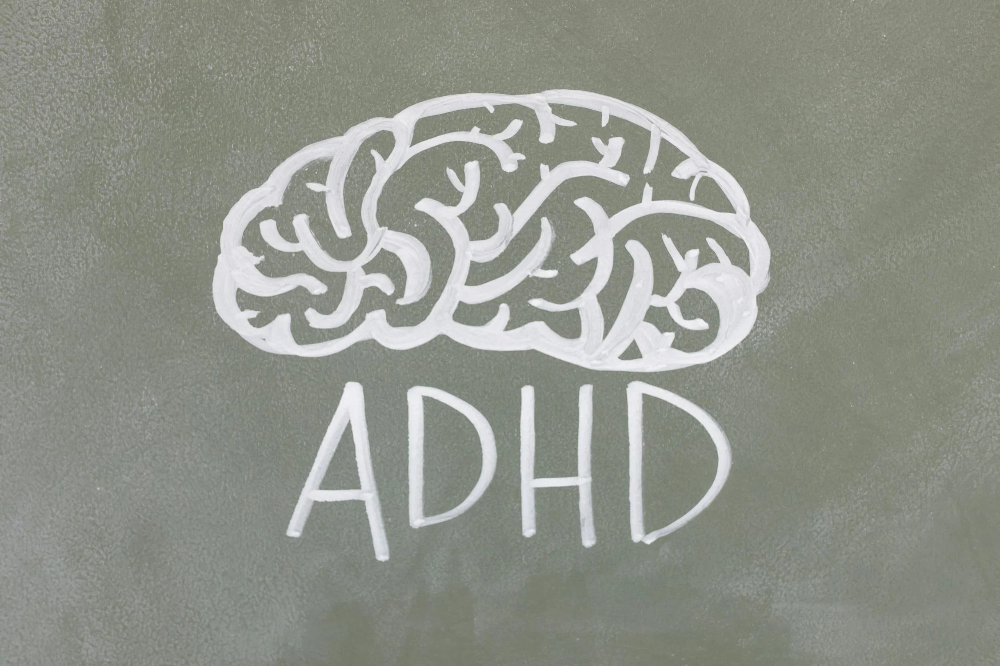

 ## Introduction
Attention Deficit Hyperactivity Disorder (ADHD) is one of the most common neurodevelopmental disorders, affecting around 11% of adolescents globally. It is characterized by persistent patterns of inattention, hyperactivity, and/or impulsivity that interfere with functioning or development. ADHD is not experienced the same way by everyone—its symptoms can vary significantly between individuals, especially across sexes. While boys are more likely to be diagnosed (around 14%), ADHD in girls (around 8%) often goes unnoticed due to more subtle, inattentive symptoms. These undiagnosed cases can severely impact mental health and quality of life over time.

## Challenge Overview
In this WiDS 2025 Datathon, the mission is to build a machine learning model that can predict two key outcomes:

    Whether an individual has ADHD (1 = Yes, 0 = No)
    
    The individual’s sex (1 = Female, 0 = Male)

This prediction will be based on:
    
    Functional brain imaging data
    
    Socio-demographic data
    
    Emotion and parenting-related information

In [150]:
# import library
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from nilearn import datasets
from nilearn import image
from nilearn.input_data import NiftiLabelsMasker
from nilearn import plotting

## Data Overview and Exploration
We have four datasets in this challenge:
    
    1-Quantitative Metadata
    
    2-Categorical Metadata
    
    3-Functional Connectome Matrix
    
    4-Training Labels (Solutions)

In [3]:
#import data 
Q_df = pd.read_excel('TRAIN_NEW/TRAIN_QUANTITATIVE_METADATA_new.xlsx')
Cat_df=pd.read_excel('TRAIN_NEW/TRAIN_CATEGORICAL_METADATA_new.xlsx')
conn_mat=pd.read_csv('TRAIN_NEW/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES_new_36P_Pearson.csv')
sol=pd.read_excel('TRAIN_NEW/TRAINING_SOLUTIONS.xlsx')

In [18]:
sol.head()

,participant_id,ADHD_Outcome,Sex_F
0,UmrK0vMLopoR,1,1
1,CPaeQkhcjg7d,1,0
2,Nb4EetVPm3gs,1,0
3,p4vPhVu91o4b,1,1
4,M09PXs7arQ5E,1,1


C:\Users\zahra\AppData\Local\Temp\ipykernel_23132\3973621519.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=sol['Sex_F'], palette='Set2')


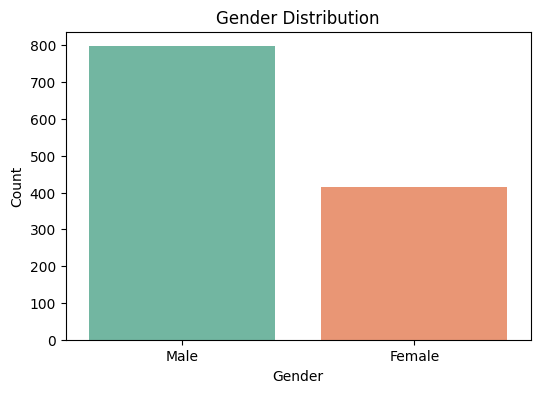

C:\Users\zahra\AppData\Local\Temp\ipykernel_23132\3973621519.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=sol['ADHD_Outcome'], palette='Set1')


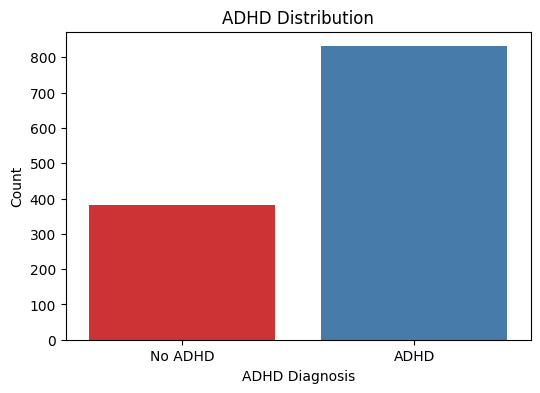

In [36]:


plt.figure(figsize=(6, 4))
sns.countplot(x=sol['Sex_F'], palette='Set2')
plt.title('Gender Distribution')
plt.xticks([0, 1], ['Male', 'Female'])
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(6, 4))
sns.countplot(x=sol['ADHD_Outcome'], palette='Set1')
plt.title('ADHD Distribution')
plt.xticks([0, 1], ['No ADHD', 'ADHD'])
plt.xlabel('ADHD Diagnosis')
plt.ylabel('Count')
plt.show()


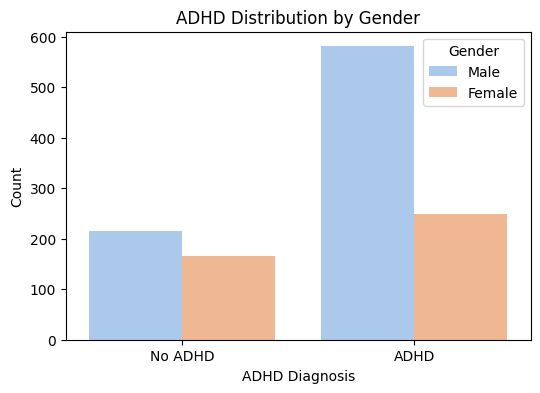

In [42]:

plt.figure(figsize=(6, 4))
sns.countplot(x=sol['ADHD_Outcome'], hue=sol['Sex_F'], palette='pastel')
plt.title('ADHD Distribution by Gender')
plt.xticks([0, 1], ['No ADHD', 'ADHD'])
plt.xlabel('ADHD Diagnosis')
plt.ylabel('Count')
plt.legend(title='Gender', labels=['Male', 'Female'])
plt.show()


### 1️⃣ Quantitative Metadata

In [29]:
Q_df

,participant_id,EHQ_EHQ_Total,ColorVision_CV_Score,APQ_P_APQ_P_CP,APQ_P_APQ_P_ID,APQ_P_APQ_P_INV,APQ_P_APQ_P_OPD,APQ_P_APQ_P_PM,APQ_P_APQ_P_PP,SDQ_SDQ_Conduct_Problems,SDQ_SDQ_Difficulties_Total,SDQ_SDQ_Emotional_Problems,SDQ_SDQ_Externalizing,SDQ_SDQ_Generating_Impact,SDQ_SDQ_Hyperactivity,SDQ_SDQ_Internalizing,SDQ_SDQ_Peer_Problems,SDQ_SDQ_Prosocial,MRI_Track_Age_at_Scan
0,00aIpNTbG5uh,100.00,13.0,3.0,15.0,44.0,14.0,20.0,27.0,3.0,17.0,4.0,11.0,5.0,8.0,6.0,2.0,9.0,14.274127
1,00fV0OyyoLfw,92.27,14.0,3.0,12.0,35.0,25.0,28.0,30.0,5.0,20.0,4.0,13.0,5.0,8.0,7.0,3.0,8.0,NaN
2,04X1eiS79T4B,86.67,14.0,3.0,21.0,37.0,18.0,26.0,28.0,3.0,24.0,7.0,10.0,10.0,7.0,14.0,7.0,7.0,13.463381
3,05ocQutkURd6,93.34,14.0,3.0,11.0,42.0,15.0,20.0,28.0,0.0,5.0,0.0,3.0,0.0,3.0,2.0,2.0,6.0,9.572553
4,06YUNBA9ZRLq,0.00,14.0,8.0,12.0,35.0,22.0,12.0,24.0,6.0,23.0,7.0,15.0,8.0,9.0,8.0,1.0,4.0,6.654574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1208,zwjJWCRzKhDz,100.00,14.0,3.0,14.0,36.0,18.0,13.0,22.0,5.0,20.0,5.0,13.0,5.0,8.0,7.0,2.0,8.0,11.272986
1209,zwXD5v17Rx01,46.67,14.0,3.0,18.0,42.0,21.0,15.0,25.0,2.0,5.0,0.0,5.0,0.0,3.0,0.0,0.0,7.0,7.364020
1210,zWzLCi3NTBTd,-40.00,14.0,3.0,19.0,34.0,20.0,20.0,25.0,2.0,14.0,3.0,9.0,3.0,7.0,5.0,2.0,9.0,9.962126
1211,Zy9GTHDxUbXU,100.00,14.0,3.0,9.0,45.0,23.0,11.0,30.0,1.0,10.0,0.0,8.0,5.0,7.0,2.0,2.0,7.0,NaN



These include scores from various psychological assessments such as:
    
     Edinburgh Handedness Questionnaire *** – Measures hand dominance (left to right scale).
    
    Ishihara Color Vision Test – Evaluates color vision ability.
    
    Alabama Parenting Questionnaire – Measures parenting styles: corporal punishment, involvement, monitoring, etc.
    
    Strength and Difficulties Questionnaire – Assesses behavioral and emotional problems (e.g., hyperactivity, conduct problems, emotional issues).
    
    Age at MRI Scan – Participant’s age when they underwent brain imaging.

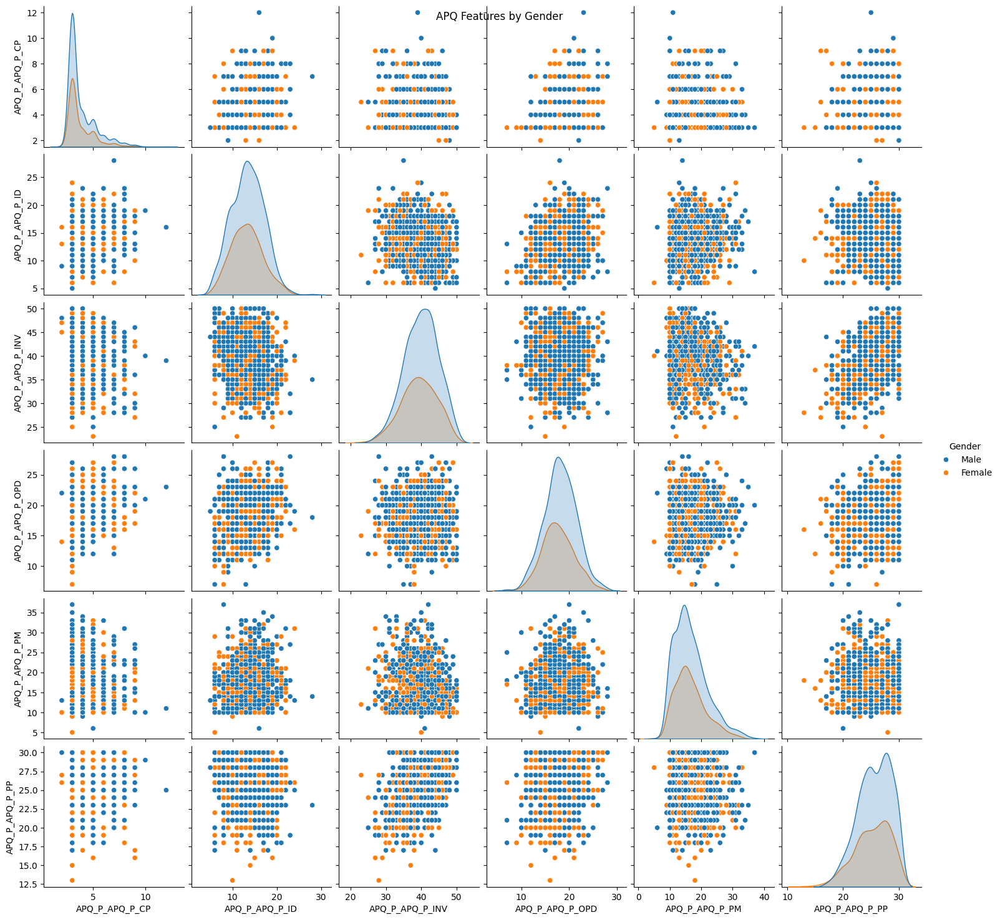

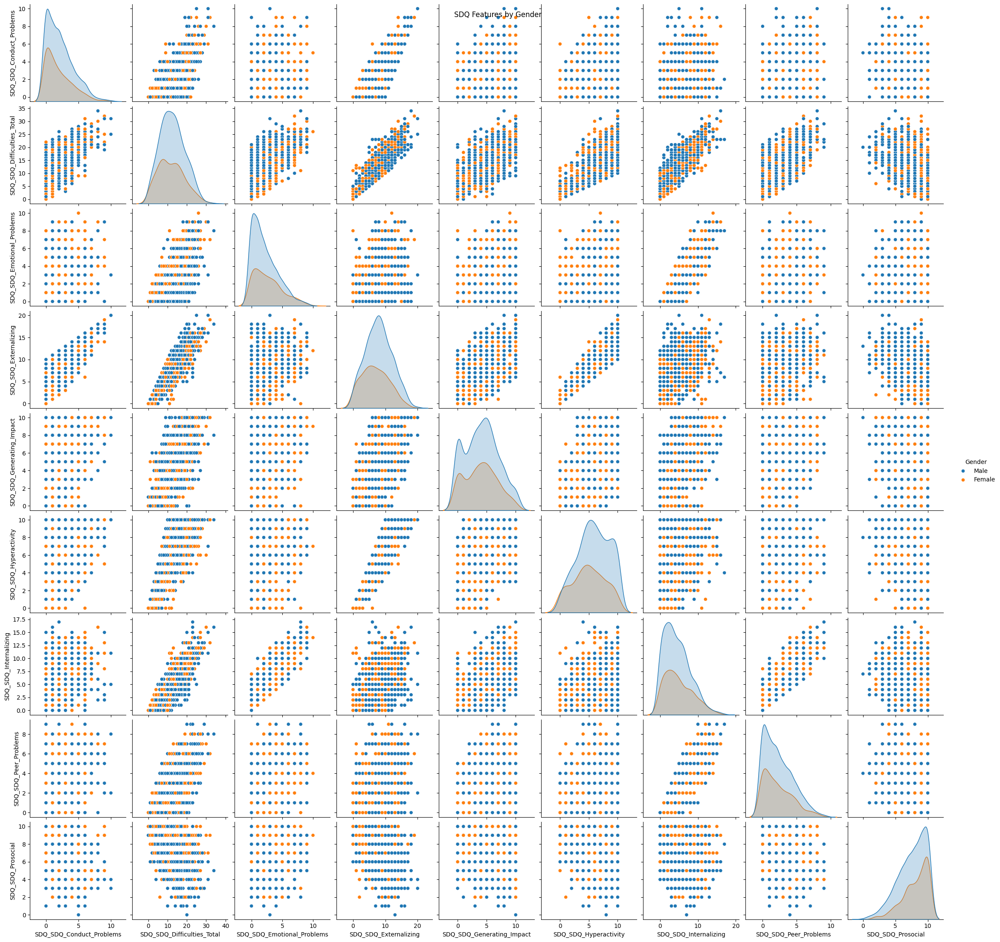

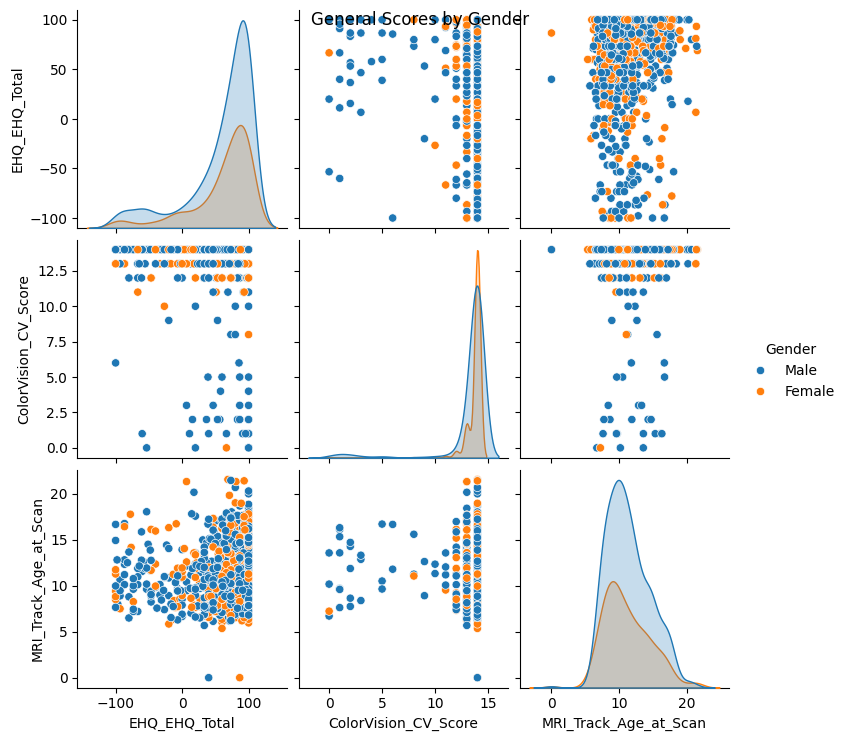

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

sol_aligned = sol.set_index('participant_id').loc[Q_df['participant_id']].reset_index()

df_visual = Q_df.copy()
df_visual['Gender'] = sol_aligned['Sex_F'].map({0: 'Male', 1: 'Female'})
df_visual['ADHD'] = sol_aligned['ADHD_Outcome'].map({0: 'No ADHD', 1: 'ADHD'})

apq_features = [
    "APQ_P_APQ_P_CP", "APQ_P_APQ_P_ID", "APQ_P_APQ_P_INV",
    "APQ_P_APQ_P_OPD", "APQ_P_APQ_P_PM", "APQ_P_APQ_P_PP"
]
sdq_features = [
    "SDQ_SDQ_Conduct_Problems", "SDQ_SDQ_Difficulties_Total",
    "SDQ_SDQ_Emotional_Problems", "SDQ_SDQ_Externalizing",
    "SDQ_SDQ_Generating_Impact", "SDQ_SDQ_Hyperactivity",
    "SDQ_SDQ_Internalizing", "SDQ_SDQ_Peer_Problems", "SDQ_SDQ_Prosocial"
]
general_features = ["EHQ_EHQ_Total", "ColorVision_CV_Score", "MRI_Track_Age_at_Scan"]

sns.pairplot(df_visual[apq_features + ['Gender']], hue='Gender', diag_kind='kde')
plt.suptitle("APQ Features by Gender")
plt.show()

sns.pairplot(df_visual[sdq_features + ['Gender']], hue='Gender', diag_kind='kde')
plt.suptitle("SDQ Features by Gender")
plt.show()

sns.pairplot(df_visual[general_features + ['Gender']], hue='Gender', diag_kind='kde')
plt.suptitle("General Scores by Gender")
plt.show()


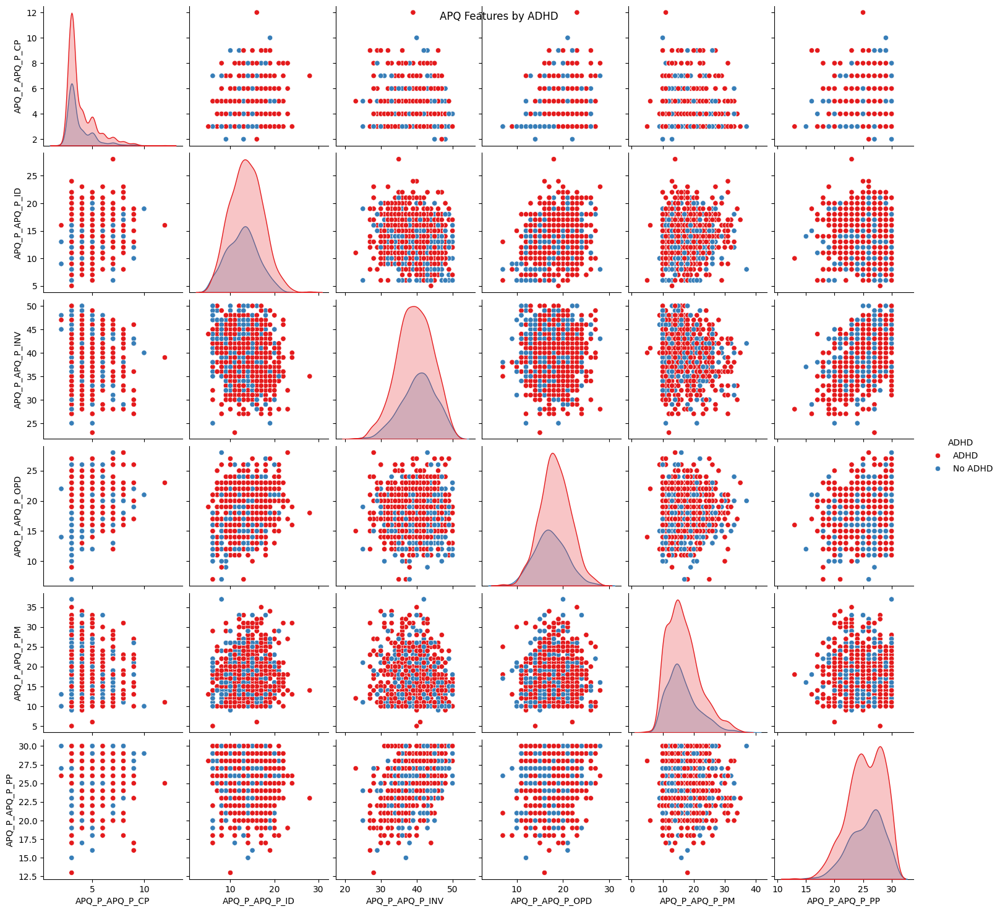

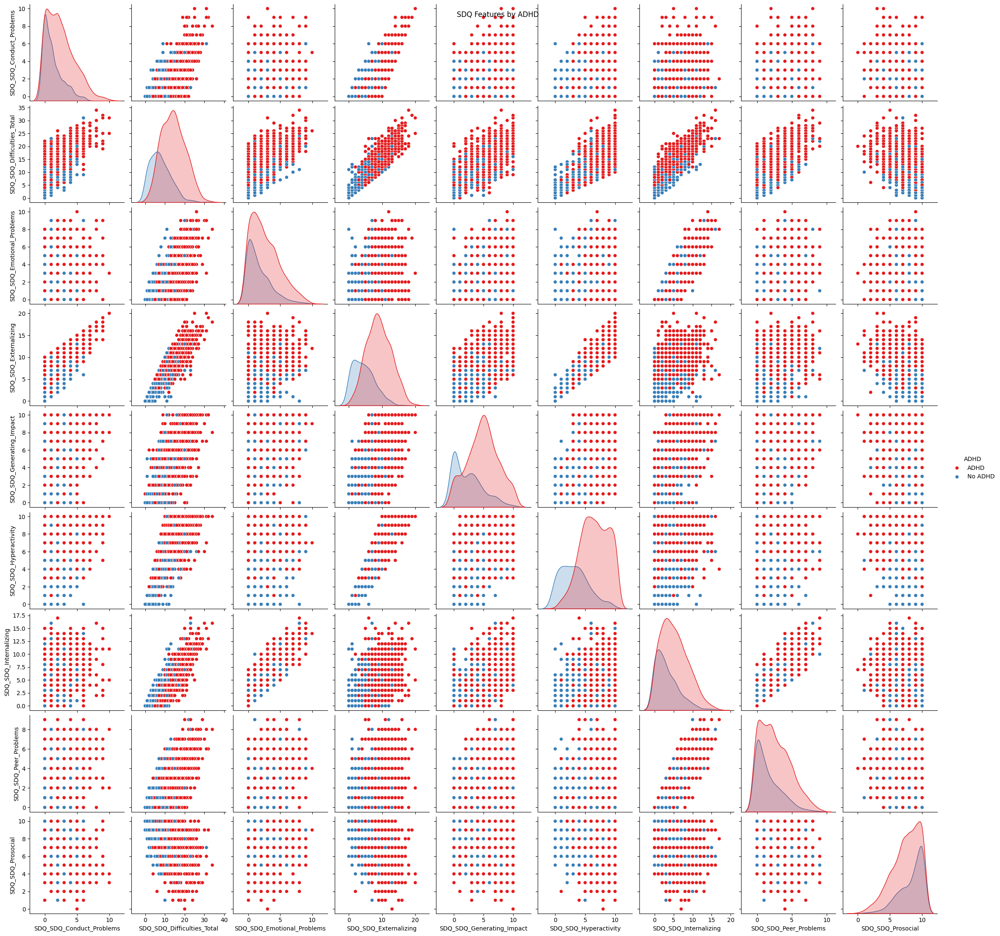

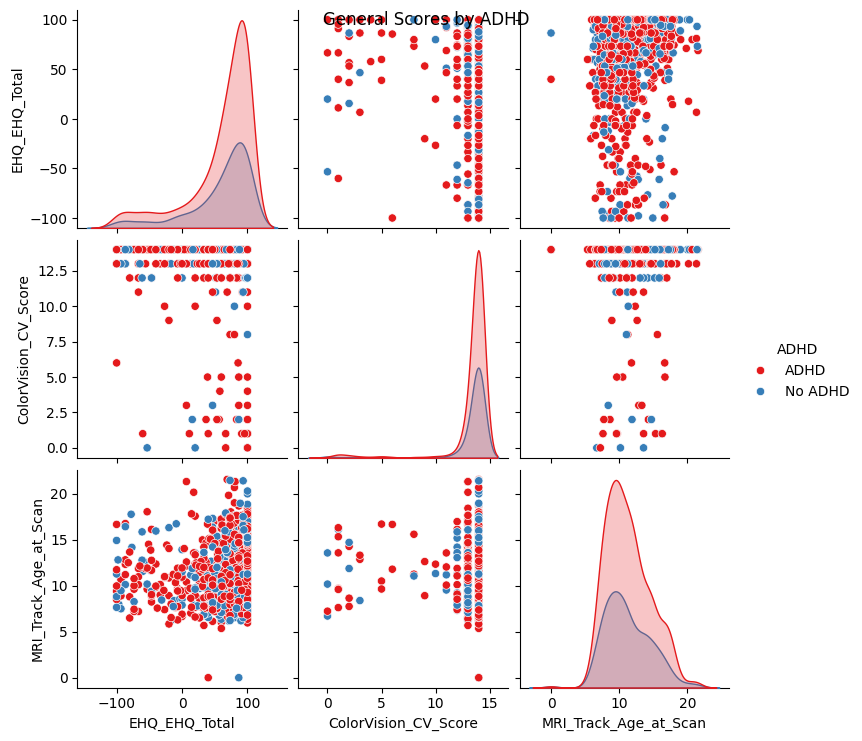

In [26]:

sns.pairplot(df_visual[apq_features + ['ADHD']], hue='ADHD', diag_kind='kde',palette='Set1')
plt.suptitle("APQ Features by ADHD")
plt.show()

sns.pairplot(df_visual[sdq_features + ['ADHD']], hue='ADHD', diag_kind='kde',palette='Set1')
plt.suptitle("SDQ Features by ADHD")
plt.show()

sns.pairplot(df_visual[general_features + ['ADHD']], hue='ADHD', diag_kind='kde',palette='Set1')
plt.suptitle("General Scores by ADHD")
plt.show()

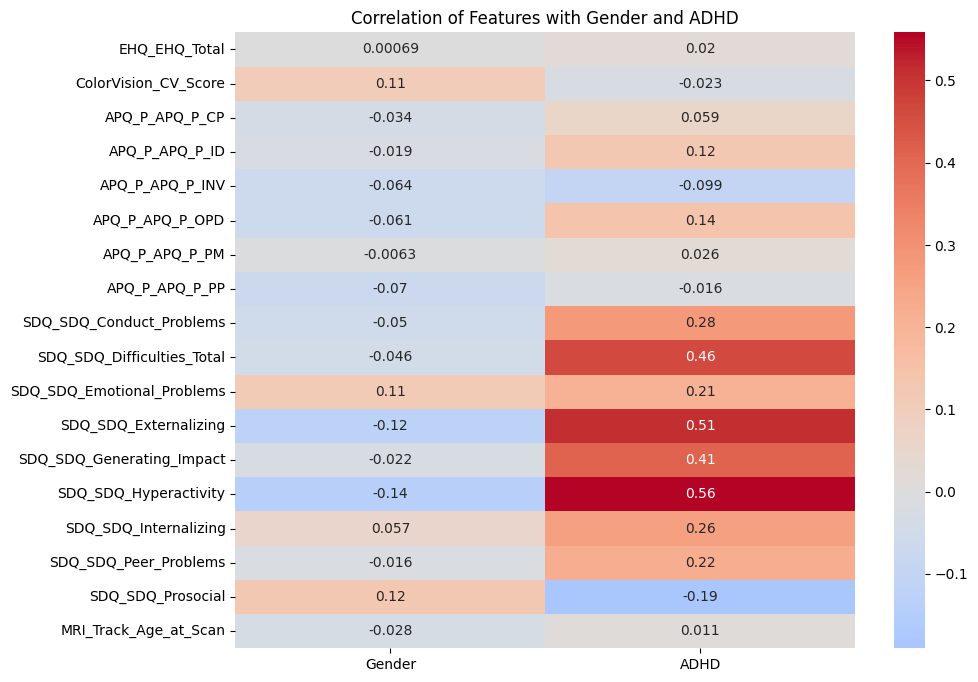

In [34]:
df_visual['Gender'] = sol_aligned['Sex_F']  
df_visual['ADHD'] = sol_aligned['ADHD_Outcome']   

numeric_cols = df_visual.select_dtypes(include='number').columns

corr_matrix = df_visual[numeric_cols].corr()

target_corr = corr_matrix[['Gender', 'ADHD']].drop(['Gender', 'ADHD']) 

plt.figure(figsize=(10, 8))
sns.heatmap(target_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation of Features with Gender and ADHD")
plt.show()

### duplicate  and missing value

In [89]:
duplicates = Q_df.duplicated().any()
duplicates

False

<Axes: >

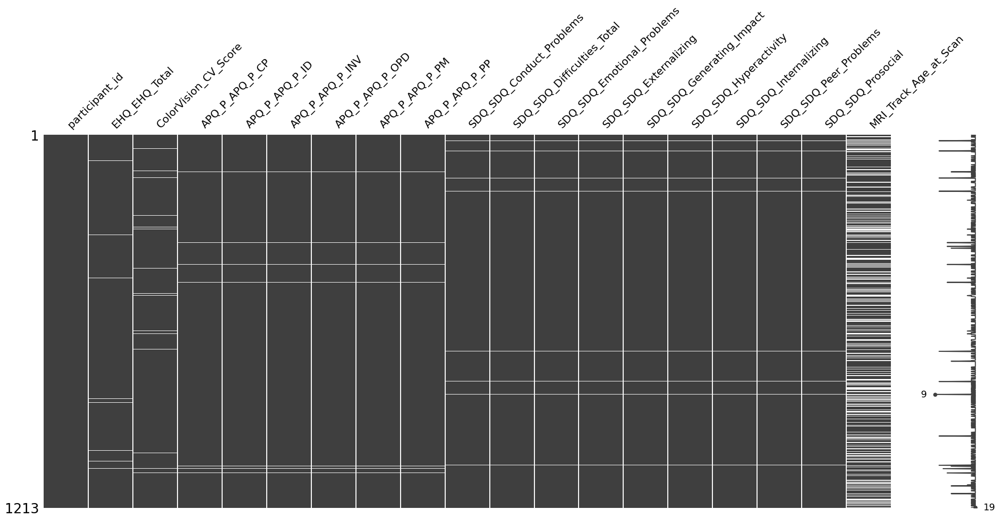

In [84]:
msno.matrix(Q_df)

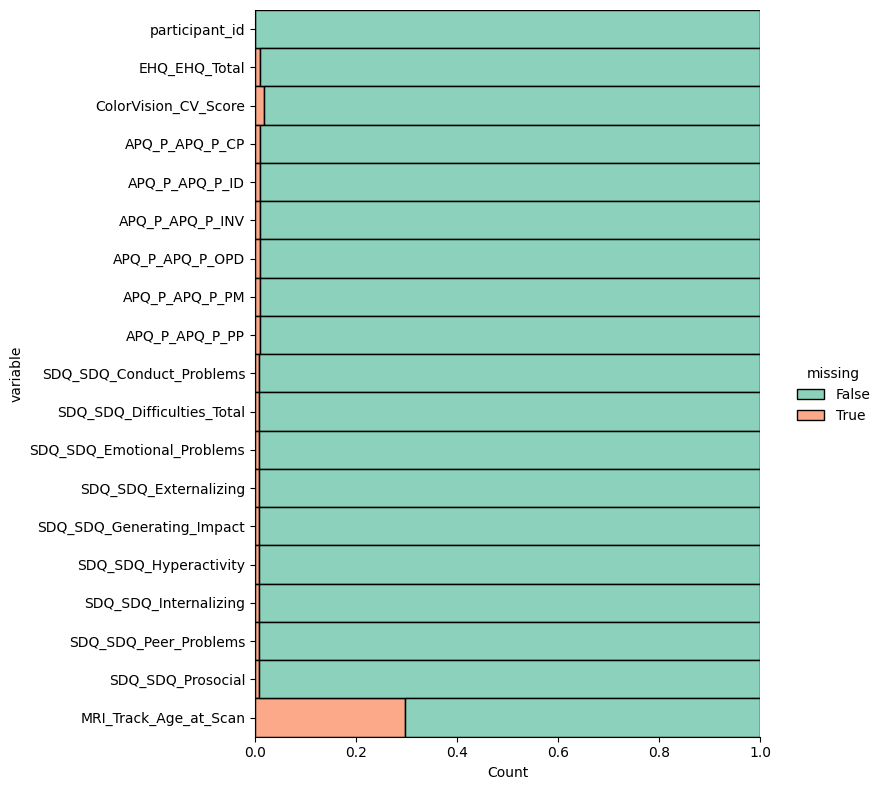

In [133]:
sns.displot(
    data=Q_df.isnull().melt(value_name='missing'),
    y='variable',
    hue='missing',
    multiple='fill',
    height=8,
    aspect=1,
    palette="Set2"
)


MRI_Track_age_at_scan will drop. this feature has low correlation with output /


### 2️⃣ Categorical Metadata 

In [6]:
Cat_df.head()

,participant_id,Basic_Demos_Enroll_Year,Basic_Demos_Study_Site,PreInt_Demos_Fam_Child_Ethnicity,PreInt_Demos_Fam_Child_Race,MRI_Track_Scan_Location,Barratt_Barratt_P1_Edu,Barratt_Barratt_P1_Occ,Barratt_Barratt_P2_Edu,Barratt_Barratt_P2_Occ
0,00aIpNTbG5uh,2019,4,1.0,0.0,3.0,21.0,45.0,NaN,NaN
1,00fV0OyyoLfw,2017,1,0.0,9.0,2.0,21.0,0.0,21.0,45.0
2,04X1eiS79T4B,2017,1,1.0,2.0,2.0,9.0,0.0,NaN,NaN
3,05ocQutkURd6,2018,1,3.0,8.0,2.0,18.0,10.0,18.0,0.0
4,06YUNBA9ZRLq,2018,1,0.0,1.0,2.0,12.0,0.0,NaN,NaN


These include demographic and background variables such as:

    Enrollment Year and Study Site – When and where the participant enrolled.
    
    Ethnicity and Race – Self-reported cultural and racial background.
    
    MRI Scan Location – Site where MRI was conducted.
    
    Parent Education & Occupation – Socioeconomic indicators from the Barratt Simplified Measure of Social Status.

In [94]:
print(Cat_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   participant_id                    1213 non-null   object 
 1   Basic_Demos_Enroll_Year           1213 non-null   int64  
 2   Basic_Demos_Study_Site            1213 non-null   int64  
 3   PreInt_Demos_Fam_Child_Ethnicity  1170 non-null   float64
 4   PreInt_Demos_Fam_Child_Race       1159 non-null   float64
 5   MRI_Track_Scan_Location           1210 non-null   float64
 6   Barratt_Barratt_P1_Edu            1198 non-null   float64
 7   Barratt_Barratt_P1_Occ            1182 non-null   float64
 8   Barratt_Barratt_P2_Edu            1015 non-null   float64
 9   Barratt_Barratt_P2_Occ            991 non-null    float64
dtypes: float64(7), int64(2), object(1)
memory usage: 94.9+ KB
None


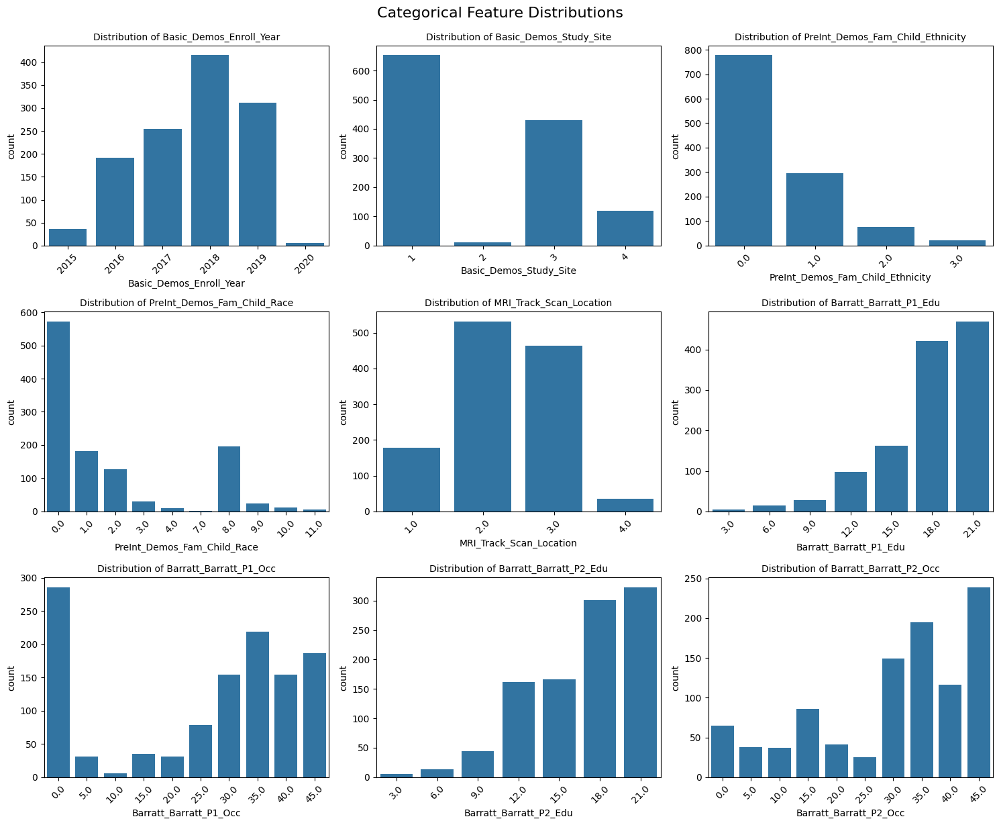

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

cat_cols = Cat_df.columns.drop("participant_id")
n_cols = 3  
n_rows = (len(cat_cols) + n_cols - 1) // n_cols  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()  

for i, col in enumerate(cat_cols):
    sns.countplot(data=Cat_df, x=col,  ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle("Categorical Feature Distributions", fontsize=16, y=1.02)
plt.show()


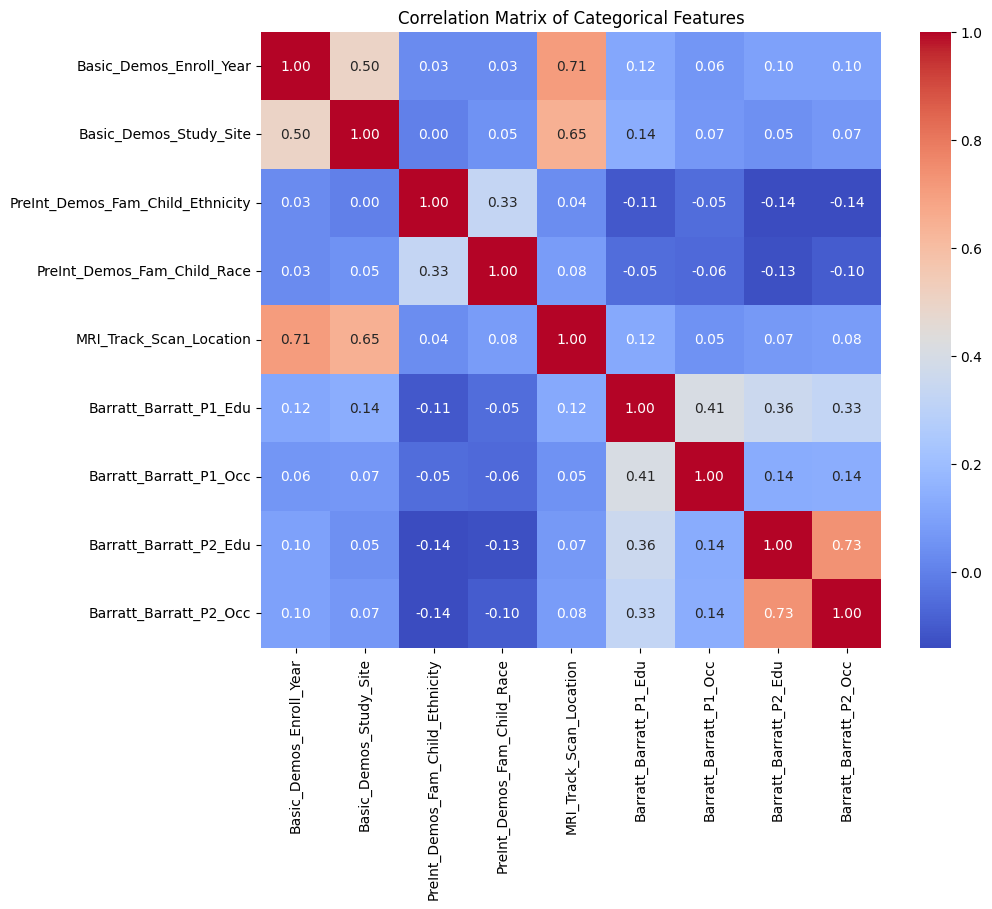

In [97]:

encoded = Cat_df[cat_cols].copy()

encoded = encoded.fillna(-1)

plt.figure(figsize=(10, 8))
sns.heatmap(encoded.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Categorical Features")
plt.show()


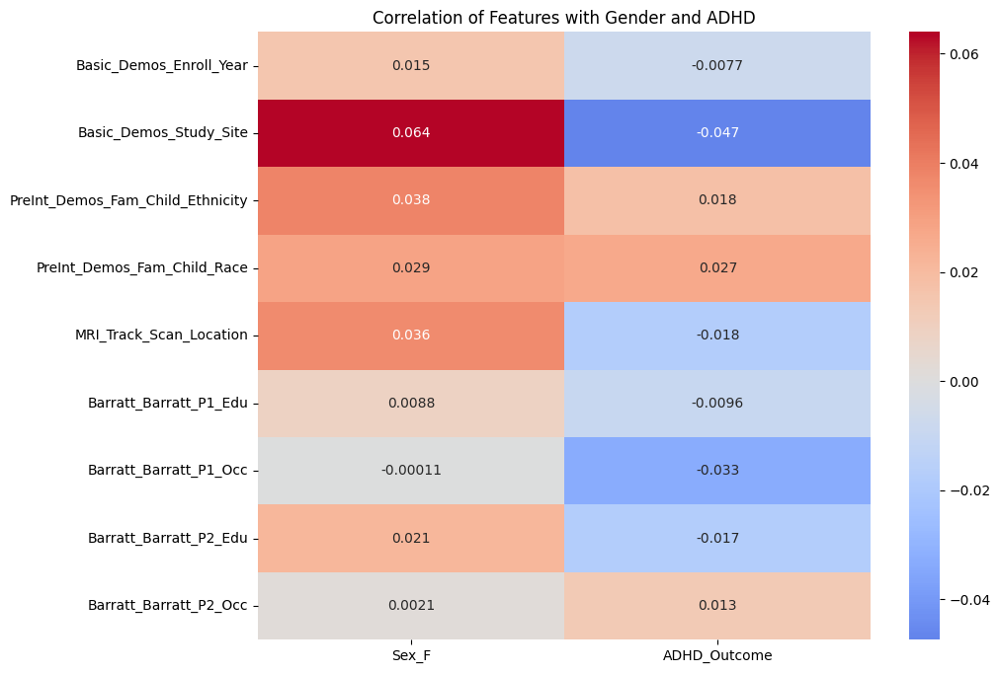

In [107]:

numeric_cols = Cat_df.select_dtypes(include='number').columns

targets = sol[['Sex_F', 'ADHD_Outcome']].loc[Cat_df.index]

combined = pd.concat([Cat_df[numeric_cols], targets], axis=1)

corr_matrix = combined.corr()

target_corr = corr_matrix[['Sex_F', 'ADHD_Outcome']].drop(['Sex_F', 'ADHD_Outcome'])

plt.figure(figsize=(10, 8))
sns.heatmap(target_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation of Features with Gender and ADHD")
plt.show()


In [110]:
duplicates = Cat_df.duplicated().any()
duplicates

False

<Axes: >

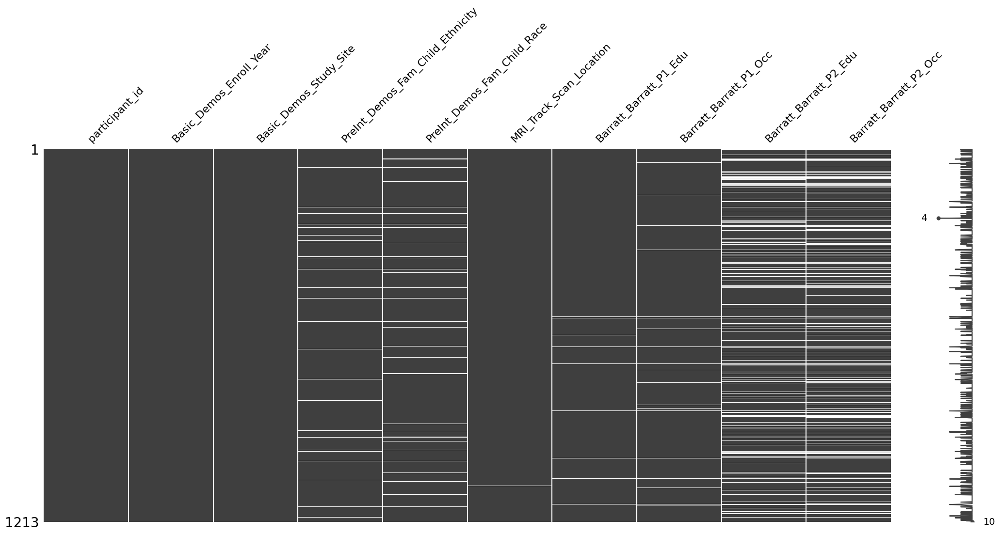

In [111]:
msno.matrix(Cat_df)

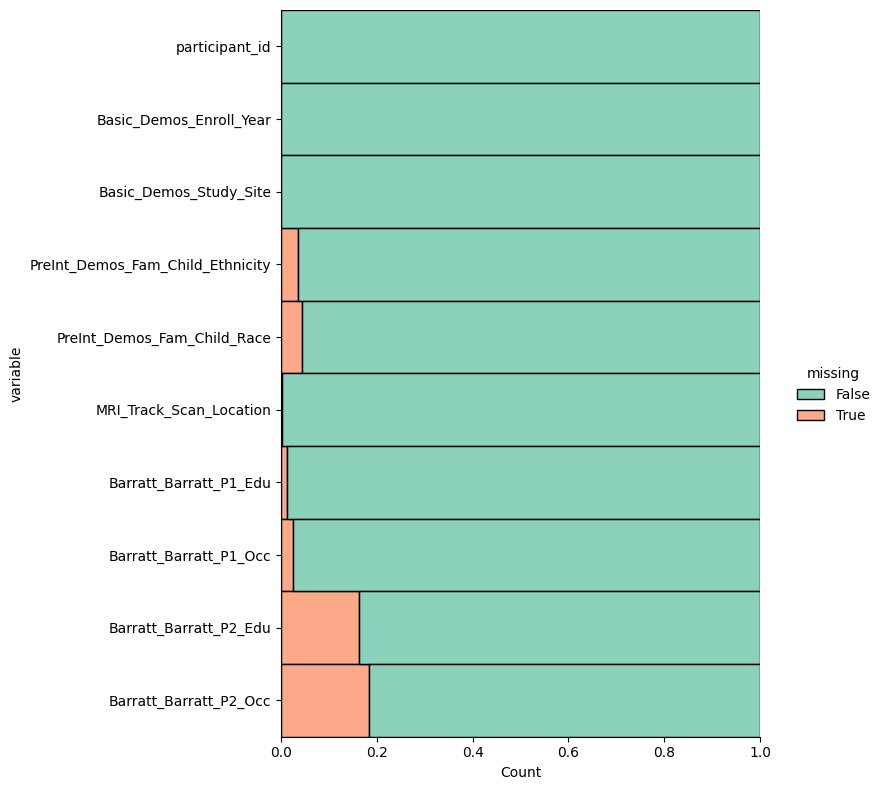

In [134]:
sns.displot(
    data=Cat_df.isnull().melt(value_name='missing'),
    y='variable',
    hue='missing',
    multiple='fill',
    height=8,
    aspect=1,
    palette="Set2"
)


### 3️⃣ Functional Connectome Matrices
Functional Connectome Matrices are square matrices that represent the functional connectivity between different regions of the brain, typically derived from functional MRI (fMRI) data. Each element in the matrix quantifies the correlation or association in brain activity between two specific regions over time.

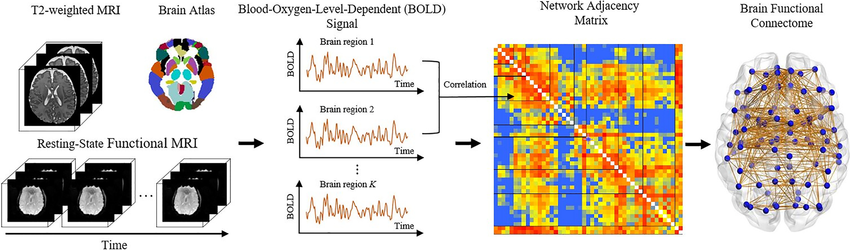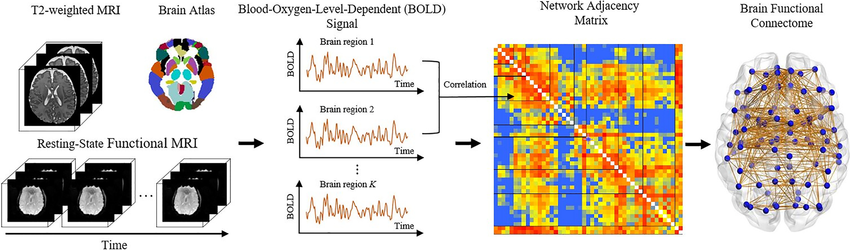

fMRI = Functional Magnetic Resonance Imaging
It’s a technique or modality used to measure brain activity non-invasively. It tracks changes in blood flow in the brain to infer which areas are more active during a task or at rest.

BOLD signal = Blood-Oxygen-Level Dependent signal
This is the actual signal that fMRI measures.

200


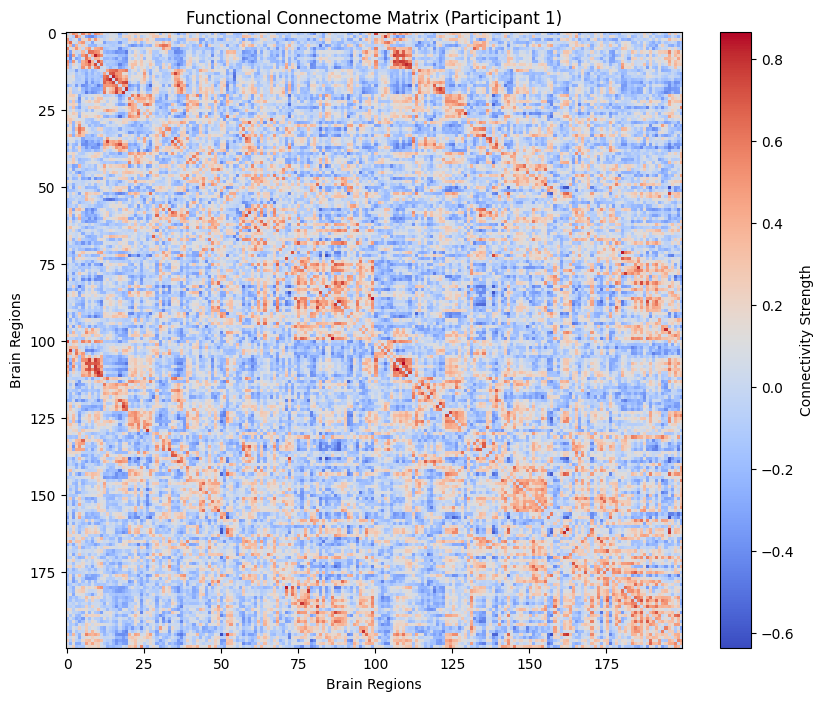

In [137]:
#Matrix of patient one (0)
row = conn_mat.iloc[0, 1:]  

n_regions = int((1 + np.sqrt(1 + 8 * len(row))) / 2)
print(n_regions)

matrix = np.zeros((n_regions, n_regions))

triu_indices = np.triu_indices(n_regions, k=1)
matrix[triu_indices] = row.values

matrix = matrix + matrix.T

plt.figure(figsize=(10, 8))
plt.imshow(matrix, cmap='coolwarm')
plt.title('Functional Connectome Matrix (Participant 1)')
plt.colorbar(label='Connectivity Strength')
plt.xlabel('Brain Regions')
plt.ylabel('Brain Regions')
plt.show()


**If n_regions = 200:**


That means the functional connectome represents 200 brain regions.

it very likely they used one of the following atlases:

**Schaefer 200**	A parcellation of the cerebral cortex into 200 regions using resting-state fMRI data.

**Craddock 200**	Another popular parcellation that uses spatially constrained clustering.

**Schaefer-200 Atlas** is the most common one used so I will use it to visulize the matrix in 3D

In [144]:
atlas = datasets.fetch_atlas_schaefer_2018(n_rois=200, yeo_networks=7)

atlas_filename = atlas['maps']

labels = atlas['labels']

[get_dataset_dir] Dataset found in C:\Users\zahra\nilearn_data\schaefer_2018

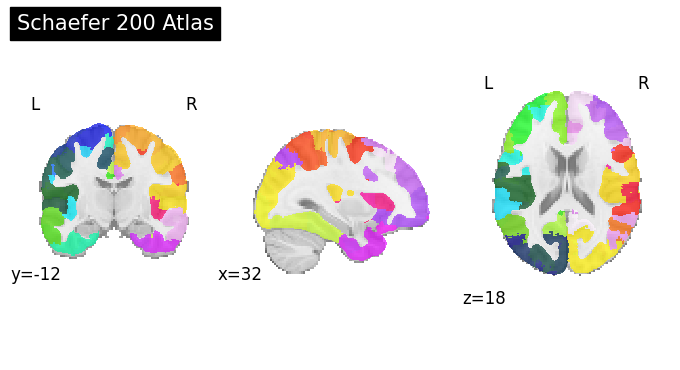

In [145]:

plotting.plot_roi(atlas_filename, title='Schaefer 200 Atlas', display_mode='ortho', draw_cross=False)
plotting.show()


In [146]:
labels

array([b'7Networks_LH_Vis_1', b'7Networks_LH_Vis_2',
       b'7Networks_LH_Vis_3', b'7Networks_LH_Vis_4',
       b'7Networks_LH_Vis_5', b'7Networks_LH_Vis_6',
       b'7Networks_LH_Vis_7', b'7Networks_LH_Vis_8',
       b'7Networks_LH_Vis_9', b'7Networks_LH_Vis_10',
       b'7Networks_LH_Vis_11', b'7Networks_LH_Vis_12',
       b'7Networks_LH_Vis_13', b'7Networks_LH_Vis_14',
       b'7Networks_LH_SomMot_1', b'7Networks_LH_SomMot_2',
       b'7Networks_LH_SomMot_3', b'7Networks_LH_SomMot_4',
       b'7Networks_LH_SomMot_5', b'7Networks_LH_SomMot_6',
       b'7Networks_LH_SomMot_7', b'7Networks_LH_SomMot_8',
       b'7Networks_LH_SomMot_9', b'7Networks_LH_SomMot_10',
       b'7Networks_LH_SomMot_11', b'7Networks_LH_SomMot_12',
       b'7Networks_LH_SomMot_13', b'7Networks_LH_SomMot_14',
       b'7Networks_LH_SomMot_15', b'7Networks_LH_SomMot_16',
       b'7Networks_LH_DorsAttn_Post_1', b'7Networks_LH_DorsAttn_Post_2',
       b'7Networks_LH_DorsAttn_Post_3', b'7Networks_LH_DorsAttn_Post_4',

In [156]:

img = image.load_img(atlas_filename)
data = img.get_fdata()
coords = plotting.find_parcellation_cut_coords(labels_img=img)

In [159]:
plotting.view_connectome(matrix, coords,edge_threshold=0.7) # thresh